# Assignment 2

In [62]:
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.special import iv

1. Bernoulli distribution is the discrete probability distribution of a random variable which takes the value 1 with probability p and the value 0 with probability q = 1 − p. A binomial random variable is random variable that represents the number of successes in n successive independent trials of a Bernoulli experiment.

   E.g. The number of heads in n coin flips.

   If X is a Binomial random variable, we denote this X ∼ B(n, p), where p is the probability of success in a given trial. The probability distribution of a random variable X which assumes integral values k = 0, . . . , n with the probabilities

                   Pr(X = k) = C(n,k) p^k (1 − p)^n−k ,           if k ∈ N, 0 ≤ k ≤ n.............. (1)

   Assume that some messages being transmitted over a network, there is a probability that the bits will be corrupted.

   A Hamming code allows for a 4 bit code to be encoded as 7 bits, with the advantage that if 0 or 1 bit(s) are corrupted, then the message can be perfectly reconstructed. You are working on a system where the probability of any bit being lost is 0.1. How does reliability change when using a Hamming code?

   Plot the probability of using error-correcting codes and the probability of without using error-correcting codes.

In [63]:
def binomial_pmf(n,x,p,q):
    f1 = np.math.factorial(n)/(np.math.factorial(x)*np.math.factorial(n-x));
    f2 = p**x;
    f3 = q**(n-x);
    f4 = f1*f2*f3;
    return f4;

In [64]:
without_Ham_code = binomial_pmf(4,0,0.1,0.9)
with_Ham_code = binomial_pmf(7,0,0.1,0.9)+binomial_pmf(7,1,0.1,0.9)

<BarContainer object of 2 artists>

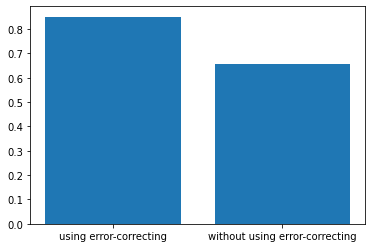

In [65]:
Data = {'using error-correcting':with_Ham_code,'without using error-correcting':without_Ham_code}
names = list(Data.keys())
values = list(Data.values())
plt.bar(names,values)

2. Let X1, X2, . . . , X100, be independent and uniformly distributed random variables over [0, 1] and Y = ∑ i=1.....100  Xi. Generate the probability density function (PDF) of Y .

E:\Python\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:ylabel='Density'>

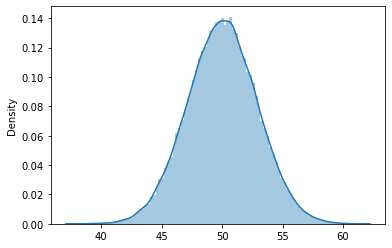

In [66]:
y = []
for i in range(100000):
    x = np.random.uniform(0,1,100)
    y.append(sum(x))
sns.distplot(y,bins=100,hist=True,kde=True)

3. The autocorrelation sequence of a random process can be estimated from a finite number of samples, e.g. x(n) for n = 0, 1, . . . , N − 1. The autocorrelation may be estimated using the sample autocorrelation as
                    
                       Rx(k) = 1/N ∑ n=0.....N-1 x(n) x∗(n − k)                ..........(2)
                    
   Since x(n) is only given for values of n within the interval [0, N − 1], in evaluating this sum, x(n) is assumed to be equal to zero for values of n that are outside the interval [0, N − 1].

   With x(n) = 1 for n = 0, 1, . . . , 7; plot the input sequence and the sample autocorrelation sequence Rx (each must be on a subplot).

In [87]:
def correlation(x1,x2):
    m = len(x1)
    n = len(x2)
    output = []
    for j in range(0,n):
        output.append(sum(np.multiply(x1[j:m],x2[0:n-j])))
    return np.array(output)/n

In [88]:
def rect_seq(a,c,n,T):
    rect =[]
    for sample in n:
        if sample <= c-T:
            rect.append(0)
        elif sample > c+T:
            rect.append(0)
        else:
            rect.append(a)
    return rect

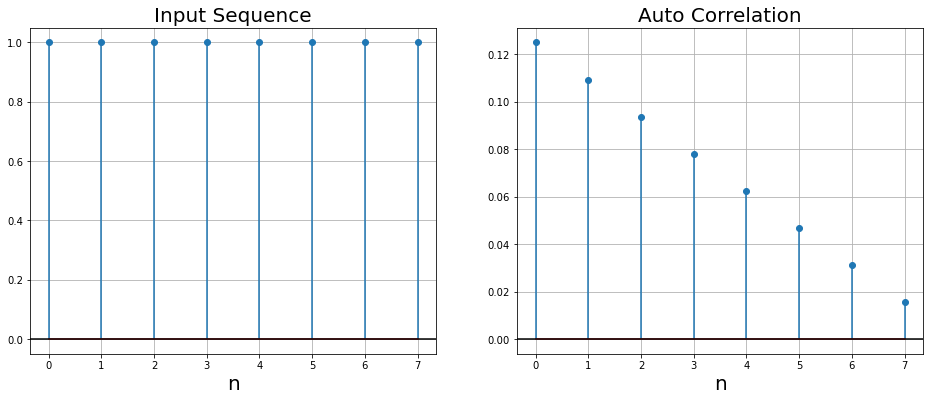

In [90]:
fig, axes = plt.subplots(1,2,figsize=(16, 6));

a = 1
c = 3
T = 4
n = np.arange(0,8,1)
x = rect_seq(a,c,n,T)
axes[0].stem(n,x)
axes[0].set_xlabel('n',fontsize=20)
axes[0].set_title('Input Sequence',fontsize=20)
axes[0].axhline(color = "Black");
axes[0].grid()

corr = np.array(correlation(np.array(x),np.array(x)))/8
axes[1].stem(n,corr)
axes[1].set_xlabel('n',fontsize=20)
axes[1].set_title('Auto Correlation',fontsize=20)
axes[1].axhline(color = "Black");
axes[1].grid()

4. (a) Generate N samples of zero mean with unit variance white Gaussian noise. Plot the histogram.

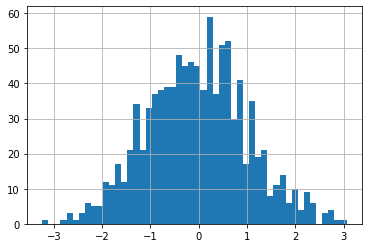

In [91]:
N = 1000
mu = 0
sigma = 1
s = np.random.normal(mu, sigma, N)
plt.hist(s,bins=50)
plt.grid()
plt.show()

(b) Estimate the first M lags of the autocorrelation sequence using the sample autocorrelation as

                       Rx(k) = 1/N ∑ n=0.....N-1 x(n) x(n − k)                ..........(3)
                       
Determine that how close is your estimate to the true autocorrelation sequence rx(k) = δ(k)?

In [95]:
def true_auto_correlation(t):
    delta =[]
    for sample in t:
        if sample == 0:
            delta.append(1)
        else:
            delta.append(0)
    return delta

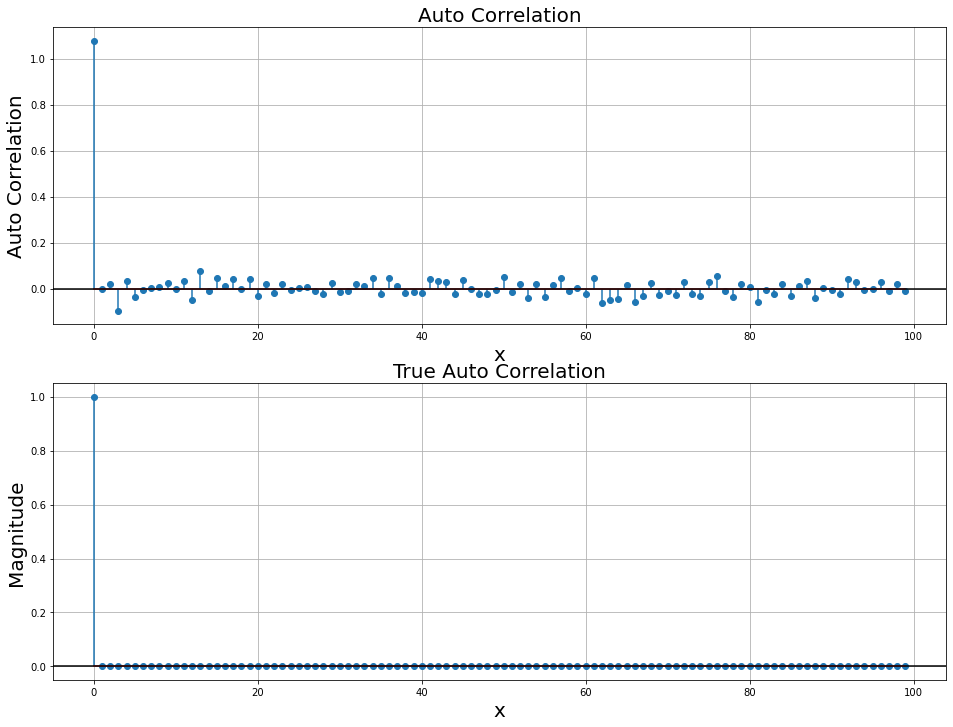

In [96]:
fig, axes = plt.subplots(2,1,figsize=(16, 12));

n2 = np.arange(0,100,1)
auto_cor = correlation(np.array(s),np.array(s))[0:100]
true_auto_cor = true_auto_correlation(n2)


axes[0].stem(n2,auto_cor)
axes[0].set_xlabel('x',fontsize=20)
axes[0].set_ylabel('Auto Correlation',fontsize=20)
axes[0].set_title('Auto Correlation',fontsize=20)
axes[0].axhline(color = "Black");
axes[0].grid()


axes[1].stem(n2,true_auto_cor)
axes[1].set_xlabel('x',fontsize=20)
axes[1].set_ylabel('Magnitude',fontsize=20)
axes[1].set_title('True Auto Correlation',fontsize=20)
axes[1].axhline(color = "Black");
axes[1].grid()

(c) Segment your white noise sequence into ten different white noise sequences each having a length of M samples, and estimate the autocorrelation by averaging the sample autocorrelations of each subsequence, i.e.,

               Rx(k) = 1/N ∑ n=0.....9 ∑ n=0.....M-1 x(n+100m) x(n−k+100m), k=0,....,M-1       ......(4)
               
Compare your estimate to that in part (b)? Also, compare it to the true autocorrelation sequence rx(k)? Choose N = 1000 and M = 100.

In [97]:
N = 10
M = 100
segment = []
for i in range(N):
    segment.append(s[(i*M):(i+1)*M])

In [98]:
Set = []
for i in range(N):
    n = len(segment[i])
    Set.append(correlation(np.array(segment[i]),np.array(segment[i])))

In [99]:
out = []
K = len(Set[0])
for i in range(K):
    add = 0
    for j in range(N):
        add+=(Set[j][i])
    out.append(add/N)

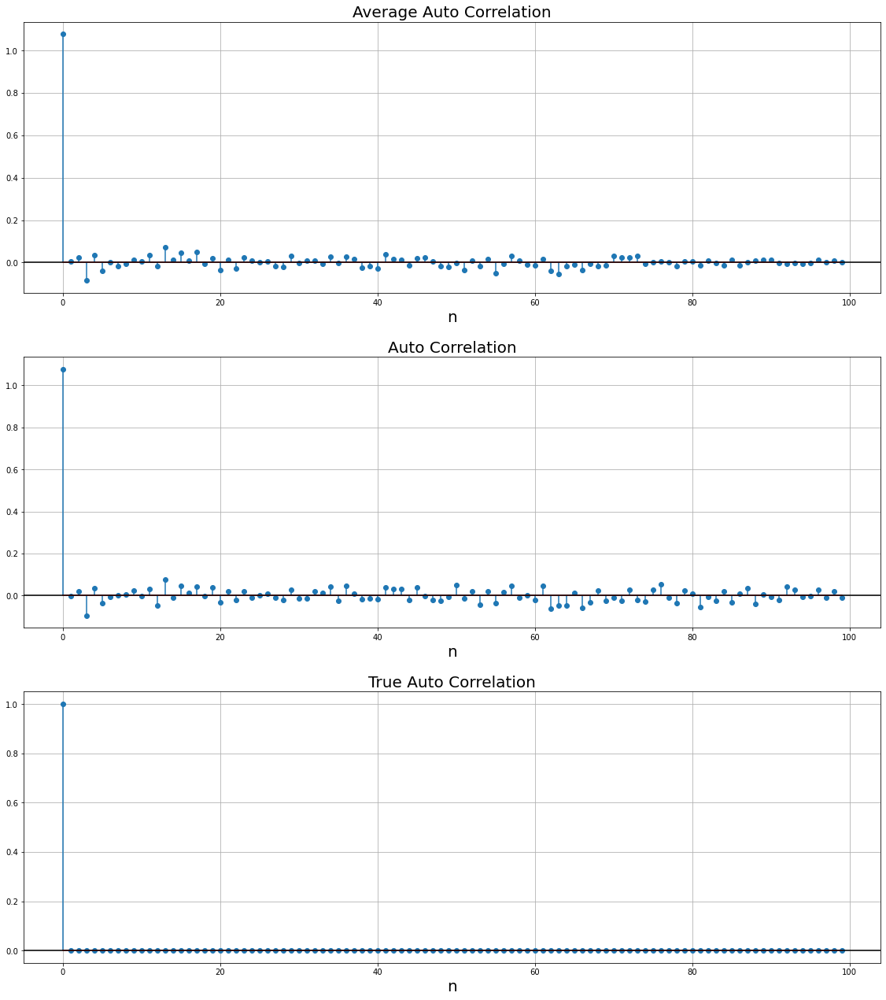

In [103]:
fig, axes = plt.subplots(3,1,figsize=(16, 18));

n3 = np.arange(0,100,1)

axes[0].stem(n3,out)
axes[0].set_xlabel('n',fontsize=20)
axes[0].set_title('Average Auto Correlation',fontsize=20)
axes[0].axhline(color = "Black");
axes[0].grid()


axes[1].stem(n3,auto_cor)
axes[1].set_xlabel('n',fontsize=20)
axes[1].set_title('Auto Correlation',fontsize=20)
axes[1].axhline(color = "Black");
axes[1].grid()


axes[2].stem(n3,true_auto_cor)
axes[2].set_xlabel('n',fontsize=20)
axes[2].set_title('True Auto Correlation',fontsize=20)
axes[2].axhline(color = "Black");
axes[2].grid()

plt.tight_layout(pad=2);

(d) Generate 10000 samples of a zero mean with unit variance white Gaussian noise sequence and estimate the first 100 lags of the autocorrelation sequence as in part (b). Plot the histogram of white Gaussian noise for 10000 samples. Compare your estimate to that in part (b)? What conclusions can you draw from these experiments?

If we increase the number of samples in auto correlation function then it's output is getting closer to true auto correlation.

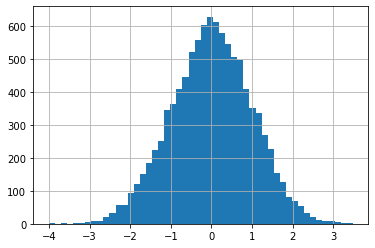

In [107]:
N = 10000
mu = 0
sigma = 1
y = np.random.normal(mu, sigma, N)
plt.hist(y,bins=50)
plt.grid()
plt.show()

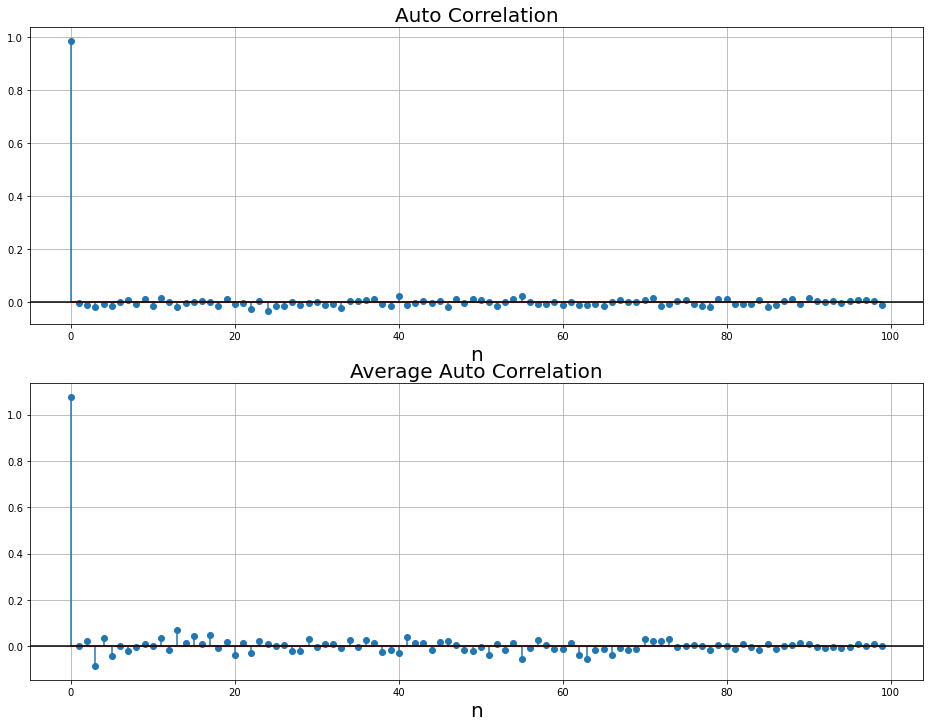

In [108]:
fig, axes = plt.subplots(2,1,figsize=(16, 12))

n4 = np.arange(0,100,1)
auto_cor = correlation(np.array(y),np.array(y))[0:100]

axes[0].stem(n4,auto_cor)
axes[0].set_xlabel('n',fontsize=20)
axes[0].set_title('Auto Correlation',fontsize=20)
axes[0].axhline(color = "Black");
axes[0].grid()


axes[1].stem(n4,out)
axes[1].set_xlabel('n',fontsize=20)
axes[1].set_title('Average Auto Correlation',fontsize=20)
axes[1].axhline(color = "Black");
axes[1].grid()

5. Define two custom functions (one for correlation and other for covariance), where each function takes two features as input and returns the correlation or covariance between the features as output. Use these functions to calculate the correlation and covariance between every possible pair of features in the dataset and display the result in the form of table (You are not allowed to use any inbuilt functions). Compare your function results with the inbuilt functions and tabulate them.

   Correlation coefficient is given by

       Rxy = ∑ i=1....n (xi − x¯)(yi − y¯)/(∑ i=1....n (xi − x¯)^2 ∑ i=1....n (yi − y¯)^2)^1/2       .......(5)

   Covariance is given by

                  Covxy = ∑ i=1....n (xi − x¯)(yi − y¯)/ N − 1                                     ........(6)

In [110]:
df = pd.read_csv('Seed_Data.csv')
df = df.drop(['target'], axis=1) 
df.head()

,A,P,C,LK,WK,A_Coef,LKG
0,15.26,14.84,0.8710,5.763,3.312,2.221,5.220
1,14.88,14.57,0.8811,5.554,3.333,1.018,4.956
2,14.29,14.09,0.9050,5.291,3.337,2.699,4.825
3,13.84,13.94,0.8955,5.324,3.379,2.259,4.805
4,16.14,14.99,0.9034,5.658,3.562,1.355,5.175


In [111]:
def correlation_coefficient(x,y):
    x1=[]
    y1=[]
    num=0
    den1=0
    den2=0
    mean_x=(np.sum(x))/(len(x))
    mean_y=(np.sum(y))/(len(y))
    
    for i in x:
        x1.append(i-mean_x)
    
   
    for j in y:
        y1.append(j-mean_y)
    
   
    for k in range(len(x1)):
        
        num=num+(x1[k]*y1[k])
        den1=den1+((x1[k])**2)
        den2=den2+((y1[k])**2)
    
    return num/np.sqrt(den1*den2)

In [112]:
def covariance(x,y):
    
    x1=[]
    y1=[]
    num=0
    mean_x=(np.sum(x))/(len(x))
    mean_y=(np.sum(y))/(len(y))
    
    for i in x:
        x1.append(i-mean_x)
    
   
    for j in y:
        y1.append(j-mean_y)
    
    for k in range(len(x1)):
        num=num+(x1[k]*y1[k])
        
    return num/(len(x1)-1)

In [113]:
A = df['A'].to_list()
P = df['P'].to_list()
C = df['C'].to_list()
LK = df['LK'].to_list()
WK = df['WK'].to_list()
A_Coef = df['A_Coef'].to_list()
LKG = df['LKG'].to_list()
S = [A,P,C,LK,WK,A_Coef,LKG]

In [114]:
# for A
cor_coff_A = []
cov_A = []
std_cor_coff_A = []
std_cov_A = []
for i in range(len(S)):
        cor_coff_A.append(correlation_coefficient(S[0],S[i]))
        cov_A.append(covariance(S[0],S[i]))
        std_cor_coff_A.append(np.corrcoef(S[0],S[i])[0][1])
        std_cov_A.append(np.cov(S[0],S[i])[0][1])

In [115]:
Column = ['A and A', 'A and P','A and C', 'A and LK','A and WK', 'A and A_Coef','A and LKG']
Data_A = {'Column':Column,'Correlation Coefficient':cor_coff_A,'Covariance':cov_A,
          'Std Correlation Coefficient':std_cor_coff_A,'Std Covariance':std_cov_A}
D_A = pd.DataFrame(Data_A)
D_A

,Column,Correlation Coefficient,Covariance,Std Correlation Coefficient,Std Covariance
0,A and A,1.000000,8.466351,1.000000,8.466351
1,A and P,0.994341,3.778443,0.994341,3.778443
2,A and C,0.608288,0.041823,0.608288,0.041823
3,A and LK,0.949985,1.224704,0.949985,1.224704
4,A and WK,0.970771,1.066911,0.970771,1.066911
5,A and A_Coef,-0.229572,-1.004356,-0.229572,-1.004356
6,A and LKG,0.863693,1.235133,0.863693,1.235133


In [116]:
# for P
cor_coff_P = []
cov_P = []
std_cor_coff_P = []
std_cov_P = []
for i in range(len(S)):
        cor_coff_P.append(correlation_coefficient(S[1],S[i]))
        cov_P.append(covariance(S[1],S[i]))
        std_cor_coff_P.append(np.corrcoef(S[1],S[i])[0][1])
        std_cov_P.append(np.cov(S[1],S[i])[0][1])

In [117]:
Column = ['P and A', 'P and P','P and C', 'P and LK','P and WK', 'P and A_Coef','P and LKG']
Data_P = {'Column':Column,'Correlation Coefficient':cor_coff_P,'Covariance':cov_P,
          'Std Correlation Coefficient':std_cor_coff_P,'Std Covariance':std_cov_P}
D_P = pd.DataFrame(Data_P)
D_P

,Column,Correlation Coefficient,Covariance,Std Correlation Coefficient,Std Covariance
0,P and A,0.994341,3.778443,0.994341,3.778443
1,P and P,1.000000,1.705528,1.000000,1.705528
2,P and C,0.529244,0.016332,0.529244,0.016332
3,P and LK,0.972422,0.562666,0.972422,0.562666
4,P and WK,0.944829,0.466065,0.944829,0.466065
5,P and A_Coef,-0.217340,-0.426766,-0.217340,-0.426766
6,P and LKG,0.890784,0.571753,0.890784,0.571753


In [118]:
# for C
cor_coff_C= []
cov_C = []
std_cor_coff_C = []
std_cov_C = []
for i in range(len(S)):
        cor_coff_C.append(correlation_coefficient(S[2],S[i]))
        cov_C.append(covariance(S[2],S[i]))
        std_cor_coff_C.append(np.corrcoef(S[2],S[i])[0][1])
        std_cov_C.append(np.cov(S[2],S[i])[0][1])

In [119]:
Column = ['C and A', 'C and P','C and C', 'C and LK','C and WK', 'C and A_Coef','C and LKG']
Data_C = {'Column':Column,'Correlation Coefficient':cor_coff_C,'Covariance':cov_C,
          'Std Correlation Coefficient':std_cor_coff_C,'Std Covariance':std_cov_C}
D_C = pd.DataFrame(Data_C)
D_C

,Column,Correlation Coefficient,Covariance,Std Correlation Coefficient,Std Covariance
0,C and A,0.608288,0.041823,0.608288,0.041823
1,C and P,0.529244,0.016332,0.529244,0.016332
2,C and C,1.000000,0.000558,1.000000,0.000558
3,C and LK,0.367915,0.003852,0.367915,0.003852
4,C and WK,0.761635,0.006798,0.761635,0.006798
5,C and A_Coef,-0.331471,-0.011777,-0.331471,-0.011777
6,C and LKG,0.226825,0.002634,0.226825,0.002634


In [120]:
# for LK
cor_coff_LK = []
cov_LK = []
std_cor_coff_LK = []
std_cov_LK = []
for i in range(len(S)):
        cor_coff_LK.append(correlation_coefficient(S[3],S[i]))
        cov_LK.append(covariance(S[3],S[i]))
        std_cor_coff_LK.append(np.corrcoef(S[3],S[i])[0][1])
        std_cov_LK.append(np.cov(S[3],S[i])[0][1])

In [121]:
Column = ['LK and A', 'LK and P','LK and C', 'LK and LK','LK and WK', 'LK and A_Coef','LK and LKG']
Data_LK = {'Column':Column,'Correlation Coefficient':cor_coff_LK,'Covariance':cov_LK,
          'Std Correlation Coefficient':std_cor_coff_LK,'Std Covariance':std_cov_LK}
D_LK = pd.DataFrame(Data_LK)
D_LK

,Column,Correlation Coefficient,Covariance,Std Correlation Coefficient,Std Covariance
0,LK and A,0.949985,1.224704,0.949985,1.224704
1,LK and P,0.972422,0.562666,0.972422,0.562666
2,LK and C,0.367915,0.003852,0.367915,0.003852
3,LK and LK,1.000000,0.196305,1.000000,0.196305
4,LK and WK,0.860415,0.143992,0.860415,0.143992
5,LK and A_Coef,-0.171562,-0.114290,-0.171562,-0.114290
6,LK and LKG,0.932806,0.203125,0.932806,0.203125


In [122]:
# for WK
cor_coff_WK = []
cov_WK = []
std_cor_coff_WK = []
std_cov_WK = []
for i in range(len(S)):
        cor_coff_WK.append(correlation_coefficient(S[4],S[i]))
        cov_WK.append(covariance(S[4],S[i]))
        std_cor_coff_WK.append(np.corrcoef(S[4],S[i])[0][1])
        std_cov_WK.append(np.cov(S[4],S[i])[0][1])

In [123]:
Column = ['WK and A', 'WK and P','WK and C', 'WK and LK','WK and WK', 'WK and A_Coef','WK and LKG']
Data_WK = {'Column':Column,'Correlation Coefficient':cor_coff_WK,'Covariance':cov_WK,
          'Std Correlation Coefficient':std_cor_coff_WK,'Std Covariance':std_cov_WK}
D_WK = pd.DataFrame(Data_WK)
D_WK

,Column,Correlation Coefficient,Covariance,Std Correlation Coefficient,Std Covariance
0,WK and A,0.970771,1.066911,0.970771,1.066911
1,WK and P,0.944829,0.466065,0.944829,0.466065
2,WK and C,0.761635,0.006798,0.761635,0.006798
3,WK and LK,0.860415,0.143992,0.860415,0.143992
4,WK and WK,1.000000,0.142668,1.000000,0.142668
5,WK and A_Coef,-0.258037,-0.146543,-0.258037,-0.146543
6,WK and LKG,0.749131,0.139068,0.749131,0.139068


In [124]:
# for A_Coef
cor_coff_A_Coef = []
cov_A_Coef = []
std_cor_coff_A_Coef = []
std_cov_A_Coef = []
for i in range(len(S)):
        cor_coff_A_Coef.append(correlation_coefficient(S[5],S[i]))
        cov_A_Coef.append(covariance(S[5],S[i]))
        std_cor_coff_A_Coef.append(np.corrcoef(S[5],S[i])[0][1])
        std_cov_A_Coef.append(np.cov(S[5],S[i])[0][1])

In [125]:
Column = ['A_Coef and A', 'A_Coef and P','A_Coef and C', 'A_Coef and LK','A_Coef and WK', 
          'A_Coef and A_Coef','A_Coef and LKG']
Data_A_Coef = {'Column':Column,'Correlation Coefficient':cor_coff_A_Coef,'Covariance':cov_A_Coef,
          'Std Correlation Coefficient':std_cor_coff_A_Coef,'Std Covariance':std_cov_A_Coef}
D_A_Coef = pd.DataFrame(Data_A_Coef)
D_A_Coef

,Column,Correlation Coefficient,Covariance,Std Correlation Coefficient,Std Covariance
0,A_Coef and A,-0.229572,-1.004356,-0.229572,-1.004356
1,A_Coef and P,-0.217340,-0.426766,-0.217340,-0.426766
2,A_Coef and C,-0.331471,-0.011777,-0.331471,-0.011777
3,A_Coef and LK,-0.171562,-0.114290,-0.171562,-0.114290
4,A_Coef and WK,-0.258037,-0.146543,-0.258037,-0.146543
5,A_Coef and A_Coef,1.000000,2.260684,1.000000,2.260684
6,A_Coef and LKG,-0.011079,-0.008187,-0.011079,-0.008187


In [126]:
# for LKG
cor_coff_LKG = []
cov_LKG = []
std_cor_coff_LKG = []
std_cov_LKG = []
for i in range(len(S)):
        cor_coff_LKG.append(correlation_coefficient(S[6],S[i]))
        cov_LKG.append(covariance(S[6],S[i]))
        std_cor_coff_LKG.append(np.corrcoef(S[6],S[i])[0][1])
        std_cov_LKG.append(np.cov(S[6],S[i])[0][1])

In [127]:
Column = ['LKG and A', 'LKG and P','LKG and C', 'LKG and LK','LKG and WK', 'LKG and A_Coef','LKG and LKG']
Data_LKG = {'Column':Column,'Correlation Coefficient':cor_coff_LKG,'Covariance':cov_LKG,
          'Std Correlation Coefficient':std_cor_coff_LKG,'Std Covariance':std_cov_LKG}
D_LKG = pd.DataFrame(Data_LKG)
D_LKG

,Column,Correlation Coefficient,Covariance,Std Correlation Coefficient,Std Covariance
0,LKG and A,0.863693,1.235133,0.863693,1.235133
1,LKG and P,0.890784,0.571753,0.890784,0.571753
2,LKG and C,0.226825,0.002634,0.226825,0.002634
3,LKG and LK,0.932806,0.203125,0.932806,0.203125
4,LKG and WK,0.749131,0.139068,0.749131,0.139068
5,LKG and A_Coef,-0.011079,-0.008187,-0.011079,-0.008187
6,LKG and LKG,1.000000,0.241553,1.000000,0.241553


6. Consider a random process X(t) = 5 sin (2t + ϕ1) + 6 cos (3t + ϕ2), where ϕ1 and ϕ2 are uniformly distributed in [−π, π] and [0, 2π], respectively, and ϕ1 and ϕ2 are independent of each other.

   (a) Determine if X(t) is a Wide Sense Stationary (WSS) Process . If yes, plot X(t) and its auto-correlation sequence.

In [128]:
def x_t(t,phi_1,phi_2):
    f1 = 5*np.sin((2*t)+phi_1)
    f2 = 6*np.cos((3*t)+phi_2)
    return f1+f2

In [131]:
t = np.linspace(0,20,21)
phi_1 = np.random.uniform(-np.pi,np.pi,1)
phi_2 = np.random.uniform(0,2*(np.pi),1)

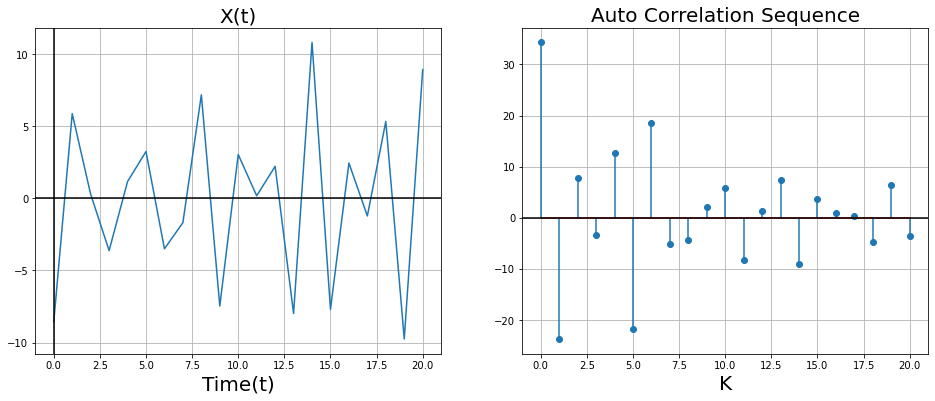

In [138]:
fig, axes = plt.subplots(1,2,figsize=(16, 6));

X_t = x_t(t,phi_1,phi_2)
axes[0].plot(t,X_t)
axes[0].set_xlabel('Time(t)',fontsize=20)
axes[0].set_title('X(t)',fontsize=20)
axes[0].axhline(color = "Black");
axes[0].axvline(color = "Black");
axes[0].grid()

cor_x_t = correlation(np.array(X_t),np.array(X_t))
axes[1].stem(t,cor_x_t)
axes[1].set_xlabel('K',fontsize=20)
axes[1].set_title('Auto Correlation Sequence',fontsize=20)
axes[1].axhline(color = "Black");
axes[1].grid()

(b) If M(t) is a WSS process and M(t) is independent of ϕ1 and ϕ2, check whether the product M(t)X(t) is a WSS or not. Provide your explanation on a paper and share the screenshot of the same.

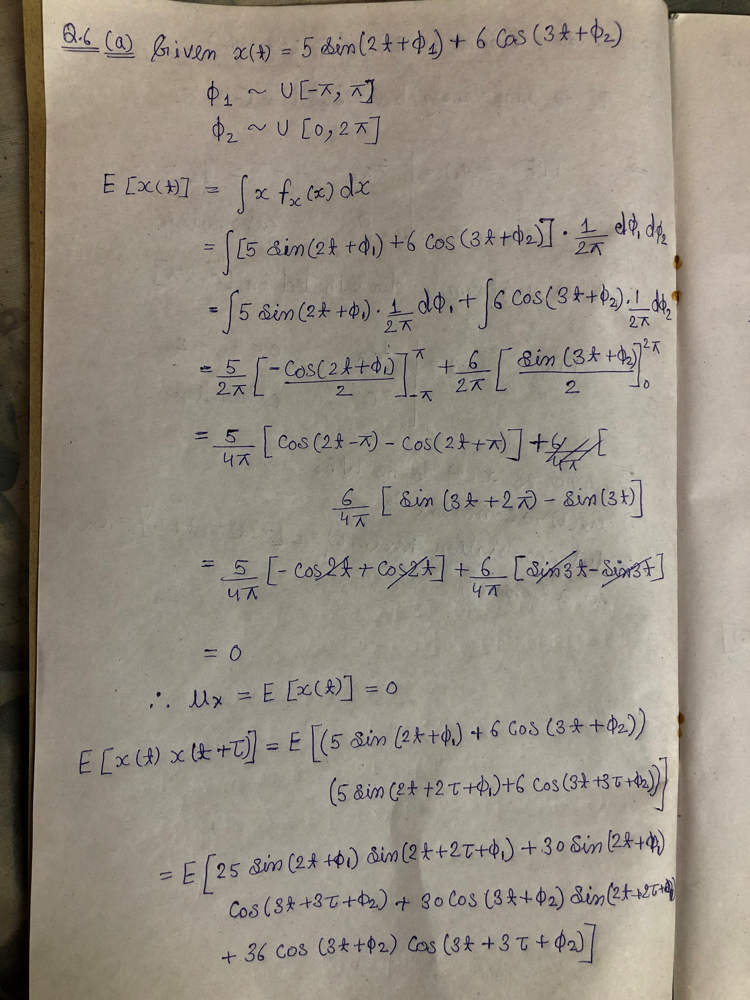

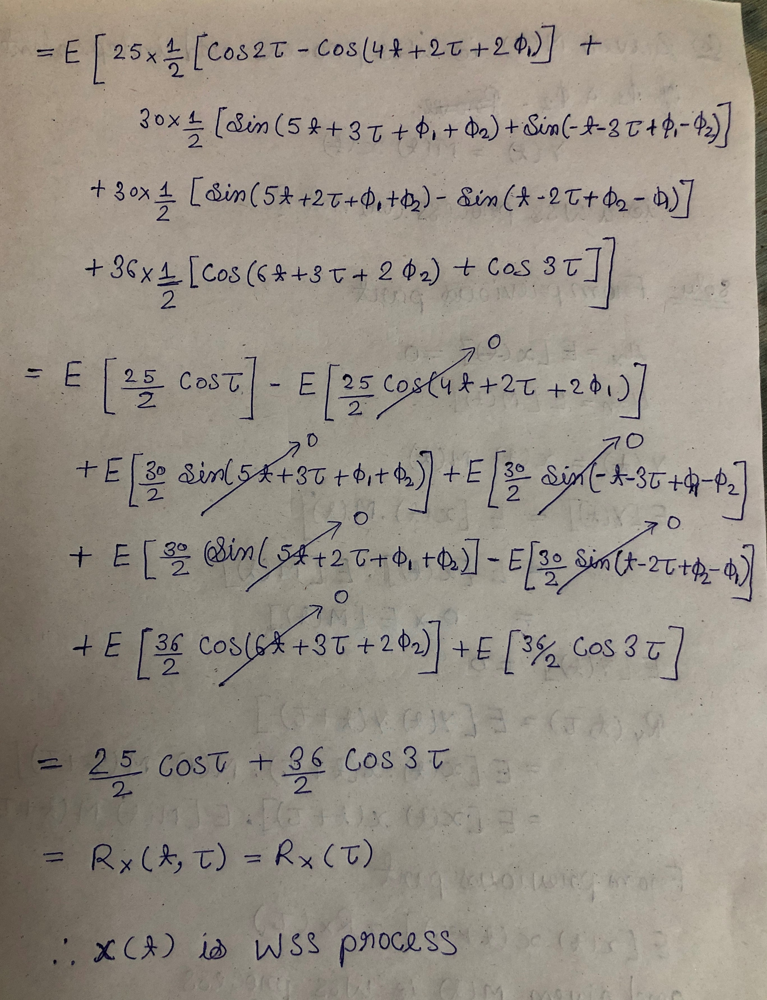

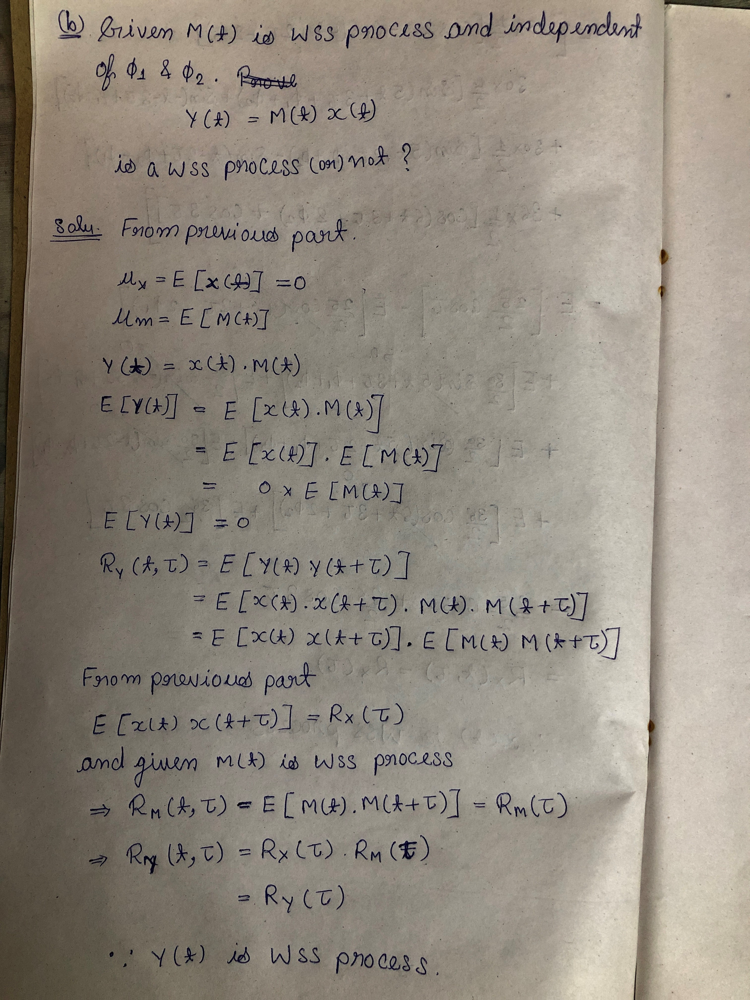

### Note: 
For questions 7, 8, and 9, you are allowed to use inbuilt functions.

7. (a) Draw out a sample for chi-squared distribution with degree of freedom 2 with size 2 × 3.

In [139]:
chi = np.random.chisquare(2,(2,3))
print(chi)

[[1.54779062 0.73338191 3.90219225]
 [0.63196213 1.07803197 0.85932524]]


(b) Visualize chi-square distribution with degree of freedom = [1, 4, 8, 12] for a size of 1000.

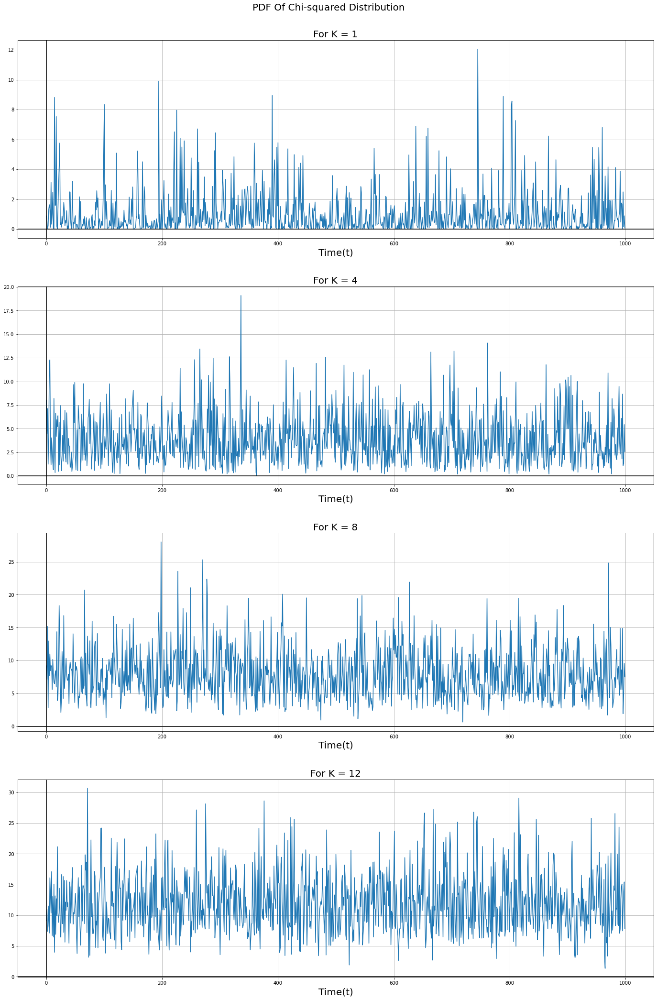

In [147]:
fig, axes = plt.subplots(4,1,figsize=(20, 30));

N = 1000
x = np.arange(0,1000,1)

k = 1
chi = np.random.chisquare(k,N)
axes[0].plot(x,chi)
axes[0].set_xlabel('Time(t)',fontsize=20)
axes[0].set_title('For K = 1',fontsize=20)
axes[0].axhline(color = "Black");
axes[0].axvline(color = "Black");
axes[0].grid()


k = 4  
chi = np.random.chisquare(k,N)
axes[1].plot(x,chi)
axes[1].set_xlabel('Time(t)',fontsize=20)
axes[1].set_title('For K = 4',fontsize=20)
axes[1].axhline(color = "Black");
axes[1].axvline(color = "Black");
axes[1].grid()


k = 8
chi = np.random.chisquare(k,N)
axes[2].plot(x,chi)
axes[2].set_xlabel('Time(t)',fontsize=20)
axes[2].set_title('For K = 8',fontsize=20)
axes[2].axhline(color = "Black");
axes[2].axvline(color = "Black");
axes[2].grid()


k = 12
chi = np.random.chisquare(k,N)
axes[3].plot(x,chi)
axes[3].set_xlabel('Time(t)',fontsize=20)
axes[3].set_title('For K = 12',fontsize=20)
axes[3].axhline(color = "Black");
axes[3].axvline(color = "Black");
axes[3].grid()

plt.suptitle('PDF Of Chi-squared Distribution',fontsize=20)
plt.tight_layout(pad=4);

8. (a) Draw out a sample for exponential distribution with 2.0 scale with 2x3 size.

In [148]:
exp = np.random.exponential(2,(2,3))
print(exp)

[[2.55245619 1.12509287 2.77421265]
 [0.82470012 2.41198039 0.44621622]]


(b) Visualize exponential distribution for a size of 1000.

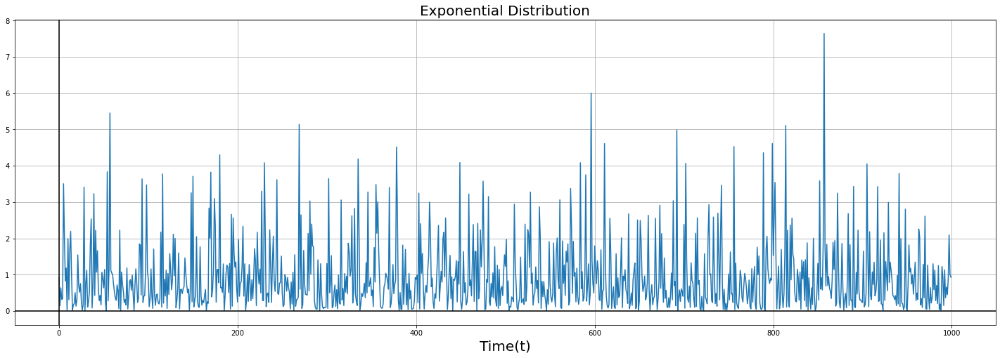

In [149]:
plt.subplots(figsize=(25, 8));
scale = 1
N = 1000
x = np.arange(0,1000,1)
exp = np.random.exponential(scale,N)
plt.plot(x,exp)
plt.xlabel('Time(t)',fontsize=20)
plt.title('Exponential Distribution',fontsize=20)
plt.axhline(color = "Black");
plt.axvline(color = "Black");
plt.grid()

9. (a) Generate a 1-D array containing 100 values, where each value has to be 2, 4, 6 or 8. The probability for the value to be 2, 4, 6, and 8 is set to be 0.1, 0.3, 0.6, 0, respectively.

In [150]:
n = 100
arr = [2,4,6,8]
P = [0.1,0.3,0.6,0]
x = np.random.choice(arr, n, p=P)
print(x)

[6 4 2 6 6 4 4 6 6 4 6 4 4 6 2 6 6 4 6 6 4 6 6 6 6 4 4 6 6 6 4 4 6 2 6 6 6
 6 4 2 6 4 6 4 4 6 4 6 6 4 2 6 6 4 4 6 4 6 6 6 6 6 6 6 6 6 4 6 6 2 6 6 4 6
 2 6 6 4 4 6 4 4 6 6 4 6 6 4 4 4 2 4 6 6 2 6 6 2 4 6]


(b) For the same example as (a), return a 2-D array with 3 rows, each containing 5 values.

In [151]:
y = np.random.choice(arr,(3,5), p=P)
print(y)

[[6 4 4 6 6]
 [6 4 6 4 2]
 [4 2 6 4 6]]


10. (a) Generate central chi-squared distributed random variables with degrees of freedom k = 1, 2, 3, 4, 5 and plot the PDFs. Write your own function, where the function takes input as degrees of freedom and returns output has chi-sqaured distributed random variable.

In [152]:
def chi_square_pdf(x,k):
        f1 = math.gamma(k/2);
        f2 = 1/(((2)**(k/2))*f1);
        f3 =  ((x)**((k/2)-1))*(np.exp(-(x/2)))*f2
        return f3

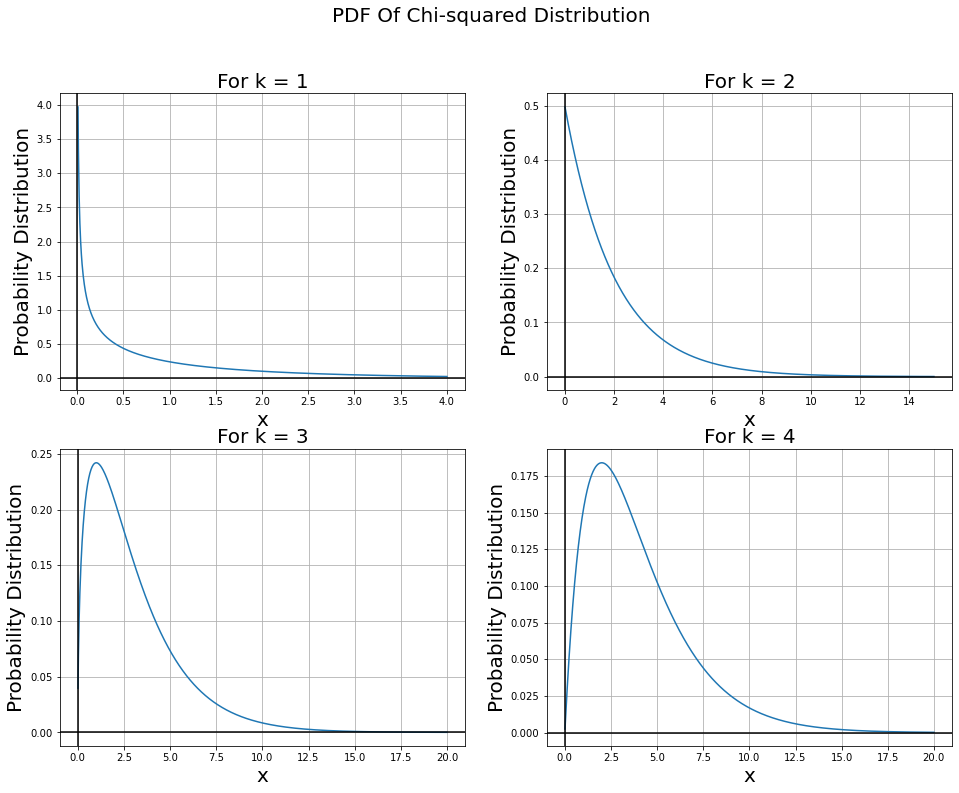

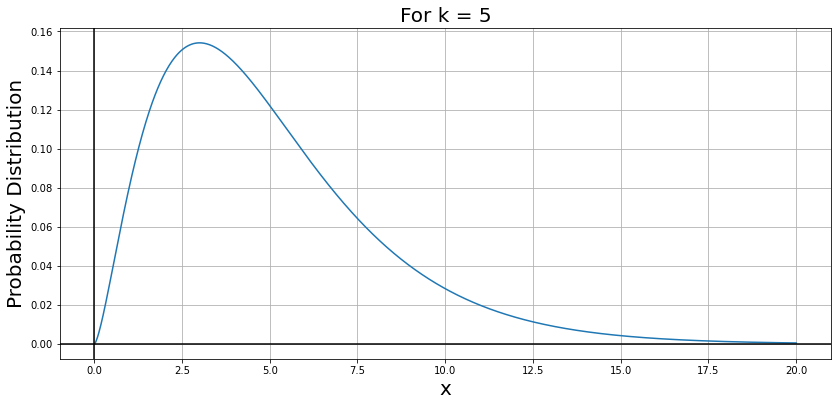

In [154]:
fig, axes = plt.subplots(2,2,figsize=(16, 12));


######################################################################################################################
######################################################################################################################

# plot Chi squared distribution.
k = 1
x = np.linspace(0.01,4,1000)
chi = chi_square_pdf(x,k)
axes[0,0].plot(x,chi)
axes[0,0].set_xlabel('x',fontsize=20)
axes[0,0].set_ylabel('Probability Distribution',fontsize=20)
axes[0,0].set_title('For k = 1',fontsize=20)
axes[0,0].axhline(color = "Black");
axes[0,0].axvline(color = "Black");
axes[0,0].grid()


######################################################################################################################
######################################################################################################################

# plot Chi squared distribution.
k = 2
x = np.linspace(0.01,15,1000)
chi = chi_square_pdf(x,k)
axes[0,1].plot(x,chi)
axes[0,1].set_xlabel('x',fontsize=20)
axes[0,1].set_ylabel('Probability Distribution',fontsize=20)
axes[0,1].set_title('For k = 2',fontsize=20)
axes[0,1].axhline(color = "Black");
axes[0,1].axvline(color = "Black");
axes[0,1].grid()


######################################################################################################################
######################################################################################################################

# plot Chi squared distribution.
k = 3
x = np.linspace(0.01,20,1000)
chi = chi_square_pdf(x,k)
axes[1,0].plot(x,chi)
axes[1,0].set_xlabel('x',fontsize=20)
axes[1,0].set_ylabel('Probability Distribution',fontsize=20)
axes[1,0].set_title('For k = 3',fontsize=20)
axes[1,0].axhline(color = "Black");
axes[1,0].axvline(color = "Black");
axes[1,0].grid()


######################################################################################################################
######################################################################################################################

# plot Chi squared distribution.
k = 4
x = np.linspace(0.01,20,1000)
chi = chi_square_pdf(x,k)
axes[1,1].plot(x,chi)
axes[1,1].set_xlabel('x',fontsize=20)
axes[1,1].set_ylabel('Probability Distribution',fontsize=20)
axes[1,1].set_title('For k = 4',fontsize=20)
axes[1,1].axhline(color = "Black");
axes[1,1].axvline(color = "Black");
axes[1,1].grid()

plt.suptitle('PDF Of Chi-squared Distribution',fontsize=20)
######################################################################################################################
######################################################################################################################

# plot convoluted signal.
plt.subplots(figsize=(12, 6));
k = 5
x = np.linspace(0.01,20,1000)
chi = chi_square_pdf(x,k)
plt.plot(x,chi)
plt.xlabel('x',fontsize=20)
plt.ylabel('Probability Distribution',fontsize=20)
plt.title('For k = 5',fontsize=20)
plt.axhline(color = "Black");
plt.axvline(color = "Black");
plt.grid()


plt.tight_layout(pad=2);

(b) Given the degrees of freedom k and non-centrality parameter λ, write a function to generate a sequence of random numbers that are non-central chi-squared distributed. Plot the PDFs for non-central chi squared random variables for two different degrees of freedom k = 2 and k = 4, each with three different non-centrality parameters λ = 1, 2, 3.

In [155]:
def non_central_chi_squared(x,k,lamda):
    f1 = 0.5*(np.exp(-0.5*(x+lamda)))
    f2 = (x/lamda)**((k/4)-0.5)
    f3 = iv((0.5*k)-1,np.sqrt(lamda*x))
    f = f1*f2*f3
    return f

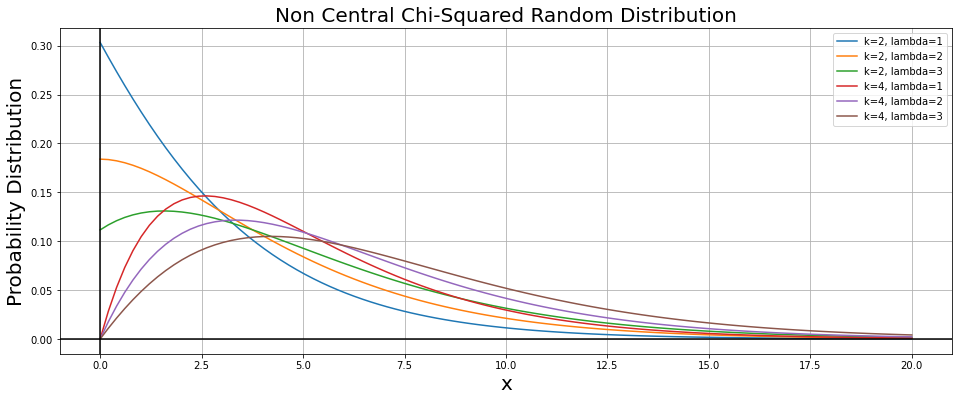

In [156]:
plt.subplots(figsize=(16, 6));
K = [2,4]
Lamda = [1,2,3]
L1 = ['k=2','k=4']
L2 = [', lambda=1',', lambda=2',', lambda=3']
x = np.linspace(0,20,100)
for i in range(len(K)):
    for j in range(len(Lamda)):
        plt.plot(x,non_central_chi_squared(x,K[i],Lamda[j]),label=L1[i]+L2[j])

plt.xlabel('x',fontsize=20)
plt.ylabel('Probability Distribution',fontsize=20)
plt.title('Non Central Chi-Squared Random Distribution',fontsize=20)
plt.axhline(color = "Black");
plt.axvline(color = "Black");
plt.legend()
plt.grid()